#                               COVID-19 - Outbreak Prediction in India and Worldwide

In [1]:
##About COVID-19

The **coronavirus (COVID-19)** pandemic has spread across 213 countries infecting 2 crores people and killing 7 lakh so far. In India, as many as 1.5 crore COVID-19 cases have been reported so far. Of these, 10 lakh have recovered and 10 thousands have died. 

On March 24, Prime Minister Narendra Modi First time annouced that the country would go under 21-day lackdown to combat the spread of the virus.
Infections are rapidly rising in Italy, France, Germany, Spain, United Kingdom and the United States. It has has a massive impact on the global economy and stock markets

The outbreak of COVID-19 has developed into a major international crisis, and it influenced important aspects of daily life. For example in India:

- **Travel:** Complete lockdown no domestic or international flights are allowed in India for till Lockdown as decided by Ministry of Civil Aviation.
- **Grocery stores:** In highly affected areas, people are starting to stock up on essential goods leading to shortage of essential stuff.
- **Students have very much difficulties in this panedmic**   

**Corona Virus Explained in Simple Terms:**
- Let's say Raghav got infected yesterday, but he won't know it untill next 14 days
- Raghav thinks he is healthy but he is infecting 10 persons per day
- Now these 10 persons think they are completely healthy, they travel, go out and infect 100 others
- These 100 persons think they are healthy but they have already infected 1000 persons
- No one knows who is healthy or who can infect you
- All you can do is be responsible, stay in quarentine

##Problem Statement:

As the coronavirus outbreak continues to spread in the country, the question that we as Indians are trying to answer is : 

**"Will India be able to tackle this pandemic or are we going to witness another Italy/ S.Korea/ Wuhan?"**
### Goal:
We need a strong model that predicts how the virus could spread across different countries and regions. The goal of this task is to build a model that predicts the spread of the virus in the next 7 days.
###Tasks to be performed:
- Analysing the present condition in India
- Is this trend similar to Italy/S. Korea/ Wuhan
- Exploring the world wide data
- Forecasting the world wide COVID-19 cases using Prophet

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import folium
from folium import plugins

plt.rcParams['figure.figsize'] =10,12

import warnings
warnings.filterwarnings('ignore')

In [3]:
#Learn how to read a .xls file by creating a dataframe using pandas
df=pd.read_csv('_covid_19_india.csv')
df_india=df.copy()
df.head

<bound method NDFrame.head of        Sno      Date     Time                      State/UnionTerritory  \
0        1  30/01/20  6:00 PM                                    Kerala   
1        2  31/01/20  6:00 PM                                    Kerala   
2        3  01/02/20  6:00 PM                                    Kerala   
3        4  02/02/20  6:00 PM                                    Kerala   
4        5  03/02/20  6:00 PM                                    Kerala   
5        6  04/02/20  6:00 PM                                    Kerala   
6        7  05/02/20  6:00 PM                                    Kerala   
7        8  06/02/20  6:00 PM                                    Kerala   
8        9  07/02/20  6:00 PM                                    Kerala   
9       10  08/02/20  6:00 PM                                    Kerala   
10      11  09/02/20  6:00 PM                                    Kerala   
11      12  10/02/20  6:00 PM                                    Keral

In [4]:
# Coordinates of India States and Union Territories
India_coord = pd.read_excel('Indian Coordinates.xlsx')

#Day by day data of India, Korea, Italy and Wuhan
dbd_India = pd.read_excel('per_day_cases.xlsx',parse_dates=True, sheet_name='India')
dbd_Italy = pd.read_excel('per_day_cases.xlsx',parse_dates=True, sheet_name="Italy")
dbd_Korea = pd.read_excel('per_day_cases.xlsx',parse_dates=True, sheet_name="Korea")
dbd_Wuhan = pd.read_excel('per_day_cases.xlsx',parse_dates=True, sheet_name="Wuhan")

In [5]:
df.drop(['Sno'],axis=1,inplace=True)
df.dropna(axis=0,how='any',inplace=True)

In [6]:
df['ConfirmedIndianNational'] = pd.to_numeric(df['ConfirmedIndianNational'], errors='coerce')
df['ConfirmedForeignNational'] = pd.to_numeric(df['ConfirmedForeignNational'], errors='coerce')

In [7]:
df.fillna(0)

,Date,Time,State/UnionTerritory,ConfirmedIndianNational,ConfirmedForeignNational,Cured,Deaths,Confirmed
0,30/01/20,6:00 PM,Kerala,1.0,0.0,0,0,1
1,31/01/20,6:00 PM,Kerala,1.0,0.0,0,0,1
2,01/02/20,6:00 PM,Kerala,2.0,0.0,0,0,2
3,02/02/20,6:00 PM,Kerala,3.0,0.0,0,0,3
4,03/02/20,6:00 PM,Kerala,3.0,0.0,0,0,3
5,04/02/20,6:00 PM,Kerala,3.0,0.0,0,0,3
6,05/02/20,6:00 PM,Kerala,3.0,0.0,0,0,3
7,06/02/20,6:00 PM,Kerala,3.0,0.0,0,0,3
8,07/02/20,6:00 PM,Kerala,3.0,0.0,0,0,3
9,08/02/20,6:00 PM,Kerala,3.0,0.0,0,0,3


In [8]:
df.style.background_gradient(cmap='Blues')

In [9]:
#Total case is the total number of confirmed cases (Indian National + Foreign National)


df['Total cases'] = df['ConfirmedIndianNational'] + df['ConfirmedForeignNational']
df['Total cases'] = pd.to_numeric(df['Total cases'], errors='coerce')
total_cases = df['Total cases'].sum()
print('Total no. of confirmed cases across INDIA: ',total_cases)

Total no. of confirmed cases across INDIA:  6103.0


In [10]:
print (df.dtypes)

Date                         object
Time                         object
State/UnionTerritory         object
ConfirmedIndianNational     float64
ConfirmedForeignNational    float64
Cured                         int64
Deaths                        int64
Confirmed                     int64
Total cases                 float64
dtype: object


In [11]:
print('Total Death and cured cases in india on (22nd March,2020) : ',(df['Cured'].sum()+df['Deaths'].sum()))

Total Death and cured cases in india on (22nd March,2020) :  21168914


In [12]:
df.loc[65]

Date                        08/03/20
Time                         6:00 PM
State/UnionTerritory          Ladakh
ConfirmedIndianNational            2
ConfirmedForeignNational           0
Cured                              0
Deaths                             0
Confirmed                          2
Total cases                        2
Name: 65, dtype: object

In [13]:
df['Total Active'] = df['Total cases']-df['Deaths'] - df['Cured']
#total_active = df['Total Active'].sum()
#print('Total active cases across india on (22nd March,2020) : ',total_active)

In [14]:
#Active cases according to states and UT

Tot_cases = df.groupby('State/UnionTerritory')['Total Active'].sum().sort_values(ascending=False).to_frame()
Tot_cases.style.background_gradient(cmap='Reds')

,Total Active
State/UnionTerritory,
Maharashtra,1079
Kerala,1061
Rajasthan,388
Karnataka,365
Uttar Pradesh,356
Telengana,329
Haryana,321
Delhi,286
Gujarat,248


In [15]:
df.rename(columns={'State/UnionTerritory':'Name of State / UT'}, inplace=True)
df

,Date,Time,Name of State / UT,ConfirmedIndianNational,ConfirmedForeignNational,Cured,Deaths,Confirmed,Total cases,Total Active
0,30/01/20,6:00 PM,Kerala,1.0,0.0,0,0,1,1.0,1.0
1,31/01/20,6:00 PM,Kerala,1.0,0.0,0,0,1,1.0,1.0
2,01/02/20,6:00 PM,Kerala,2.0,0.0,0,0,2,2.0,2.0
3,02/02/20,6:00 PM,Kerala,3.0,0.0,0,0,3,3.0,3.0
4,03/02/20,6:00 PM,Kerala,3.0,0.0,0,0,3,3.0,3.0
5,04/02/20,6:00 PM,Kerala,3.0,0.0,0,0,3,3.0,3.0
6,05/02/20,6:00 PM,Kerala,3.0,0.0,0,0,3,3.0,3.0
7,06/02/20,6:00 PM,Kerala,3.0,0.0,0,0,3,3.0,3.0
8,07/02/20,6:00 PM,Kerala,3.0,0.0,0,0,3,3.0,3.0
9,08/02/20,6:00 PM,Kerala,3.0,0.0,0,0,3,3.0,3.0


In [16]:
#create zoomable map using folium

df_full = pd.merge(India_coord,df,on='Name of State / UT')
map = folium.Map(location=[20, 70], zoom_start=4,tiles='Stamenterrain')

for lat, lon, value, name in zip(df_full['Latitude'], df_full['Longitude'], df_full['Total cases'], df_full['Name of State / UT']):
    folium.CircleMarker([lat, lon], radius=value*0.8, popup = ('<strong>State</strong>: ' + str(name).capitalize() + '<br>''<strong>Total Cases</strong>: ' + str(value) + '<br>'),color='red',fill_color='red',fill_opacity=0.3 ).add_to(map)
map

In [17]:
#commulative corona cases in india
fig = go.Figure()
fig.add_trace(go.Scatter(x=dbd_India['Date'], y = dbd_India['Total Cases'], mode='lines+markers',name='Total Cases'))
fig.update_layout(title_text='Trend of Coronavirus Cases in India (Cumulative cases)',plot_bgcolor='rgb(230, 230, 230)')

fig.show()




In [18]:
import plotly.express as px
fig = px.bar(dbd_India, x="Date", y="New Cases", barmode='group', height=400)
fig.update_layout(title_text='Coronavirus Cases in India on daily basis',plot_bgcolor='rgb(230, 230, 230)')

fig.show()

In [19]:
fig = px.bar(dbd_India, x="Date", y="Total Cases", color='Total Cases', orientation='v', height=600,
             title='Confirmed Cases in India', color_discrete_sequence = px.colors.cyclical.IceFire)
fig.update_layout(plot_bgcolor='rgb(230, 230, 230)')
fig.show()

fig = px.bar(dbd_Italy, x="Date", y="Total Cases", color='Total Cases', orientation='v', height=600,
             title='Confirmed Cases in Italy', color_discrete_sequence = px.colors.cyclical.IceFire)

fig.update_layout(plot_bgcolor='rgb(230, 230, 230)')
fig.show()

fig = px.bar(dbd_Korea, x="Date", y="Total Cases", color='Total Cases', orientation='v', height=600,
             title='Confirmed Cases in South Korea', color_discrete_sequence = px.colors.cyclical.IceFire)

fig.update_layout(plot_bgcolor='rgb(230, 230, 230)')
fig.show()
fig = px.bar(dbd_Wuhan, x="Date", y="Total Cases", color='Total Cases', orientation='v', height=600,
             title='Confirmed Cases in Wuhan', color_discrete_sequence = px.colors.cyclical.IceFire)

fig.update_layout(plot_bgcolor='rgb(230, 230, 230)')
fig.show()

###Visualization Inference
- Confirmed cases in India is rising exponentially with no fixed pattern (Very less test in India)
- Confirmed cases in Italy is rising exponentially with certain fixed pattern
- Confirmed cases in S.Korea is rising gradually
- There has been only 3 confirmed cases in Wuhan since last week. They have almost controlled the COVID-19
 

In [20]:
from plotly.subplots import make_subplots

fig = make_subplots(
    rows=2, cols=2,
    specs=[[{}, {}],
           [{"colspan": 2}, None]],
    subplot_titles=("S.Korea","Italy", "India","Wuhan"))

fig.add_trace(go.Bar(x=dbd_Korea['Date'], y=dbd_Korea['Total Cases'],
                    marker=dict(color=dbd_Korea['Total Cases'], coloraxis="coloraxis")),1, 1)

fig.add_trace(go.Bar(x=dbd_Italy['Date'], y=dbd_Italy['Total Cases'],
                    marker=dict(color=dbd_Italy['Total Cases'], coloraxis="coloraxis")),1, 2)

fig.add_trace(go.Bar(x=dbd_India['Date'], y=dbd_India['Total Cases'],
                    marker=dict(color=dbd_India['Total Cases'], coloraxis="coloraxis")),2, 1)

#fig.add_trace(go.Bar(x=dbd_Wuhan['Date'], y=dbd_Wuhan['Total Cases'],
#                    marker=dict(color=dbd_Wuhan['Total Cases'], coloraxis="coloraxis")),2, 2)

fig.update_layout(coloraxis=dict(colorscale='Bluered_r'), showlegend=False,title_text="Total Confirmed cases(Cumulative)")

fig.update_layout(plot_bgcolor='rgb(230, 230, 230)')
fig.show()

In [21]:
dbd_India.fillna(0)

,Date,Total Cases,New Cases,Days after surpassing 100 cases
0,2020-01-30,1,1,0.0
1,2020-01-31,1,0,0.0
2,2020-02-01,1,0,0.0
3,2020-02-02,2,1,0.0
4,2020-02-03,3,1,0.0
5,2020-02-04,3,0,0.0
6,2020-02-05,3,0,0.0
7,2020-02-06,3,0,0.0
8,2020-02-07,3,0,0.0
9,2020-02-08,3,0,0.0


In [22]:
title = 'Main Source for News'
labels = ['S.Korea', 'Italy', 'India']
colors = ['rgb(122,128,0)', 'rgb(255,0,0)', 'rgb(49,130,189)']

mode_size = [10, 10, 12]
line_size = [1, 1, 8]

fig = go.Figure()


fig.add_trace(go.Scatter(x=dbd_Korea['Days after surpassing 100 cases'], 
                 y=dbd_Korea['Total Cases'],mode='lines',
                 name=labels[0],
                 line=dict(color=colors[0], width=line_size[0]),            
                 connectgaps=True))
fig.add_trace(go.Scatter(x=dbd_Italy['Days after surpassing 100 cases'], 
                 y=dbd_Italy['Total Cases'],mode='lines',
                 name=labels[1],
                 line=dict(color=colors[1], width=line_size[1]),            
                 connectgaps=True))

fig.add_trace(go.Scatter(x=dbd_India['Days after surpassing 100 cases'], 
                 y=dbd_India['Total Cases'],mode='lines',
                 name=labels[2],
                 line=dict(color=colors[2], width=line_size[2]),            
                 connectgaps=True))
    
    
    
annotations = []

annotations.append(dict(xref='paper', yref='paper', x=0.5, y=-0.1,
                              xanchor='center', yanchor='top',
                              text='Days after crossing 100 cases ',
                              font=dict(family='Arial',
                                        size=12,
                                        color='rgb(150,150,150)'),
                              showarrow=False))

fig.update_layout(annotations=annotations,plot_bgcolor='white',yaxis_title='Cumulative cases')

fig.show()

# **Visualization Inference:** 

* Above graph depicts the number of days after the COVID-19 cases crosses 100 vs total number of cases in each country. 
* Both Italy and S.Korea have crossed the mark of 5600 in the next 13 days.
* Number of cases detected(trend) in India is less as compared to Italy and S.Korea

In [23]:
df = pd.read_csv('covid_19_clean_complete.csv',parse_dates=['Date'])
df.rename(columns={'ObservationDate':'Date', 'Country/Region':'Country'}, inplace=True)

df_confirmed = pd.read_csv("time_series_covid19_confirmed_global.csv")
df_recovered = pd.read_csv("time_series_covid19_recovered_global.csv")
df_deaths = pd.read_csv("time_series_covid19_deaths_global.csv")

df_confirmed.rename(columns={'Country/Region':'Country'}, inplace=True)
df_recovered.rename(columns={'Country/Region':'Country'}, inplace=True)
df_deaths.rename(columns={'Country/Region':'Country'}, inplace=True)

In [24]:
df

,Province/State,Country,Lat,Long,Date,Confirmed,Deaths,Recovered
0,NaN,Thailand,15.0000,101.0000,2020-01-22,2.0,0.0,0.0
1,NaN,Japan,36.0000,138.0000,2020-01-22,2.0,0.0,0.0
2,NaN,Singapore,1.2833,103.8333,2020-01-22,0.0,0.0,0.0
3,NaN,Nepal,28.1667,84.2500,2020-01-22,0.0,0.0,0.0
4,NaN,Malaysia,2.5000,112.5000,2020-01-22,0.0,0.0,0.0
5,British Columbia,Canada,49.2827,-123.1207,2020-01-22,0.0,0.0,0.0
6,New South Wales,Australia,-33.8688,151.2093,2020-01-22,0.0,0.0,0.0
7,Victoria,Australia,-37.8136,144.9631,2020-01-22,0.0,0.0,0.0
8,Queensland,Australia,-28.0167,153.4000,2020-01-22,0.0,0.0,0.0
9,NaN,Cambodia,11.5500,104.9167,2020-01-22,0.0,0.0,0.0


In [25]:
df2 = df.groupby(["Date", "Country", "Province/State"])[['Date', 'Province/State', 'Country', 'Confirmed', 'Deaths', 'Recovered']].sum().reset_index()
df2.head()

,Date,Country,Province/State,Confirmed,Deaths,Recovered
0,2020-01-22,Australia,Australian Capital Territory,0.0,0.0,0.0
1,2020-01-22,Australia,From Diamond Princess,0.0,0.0,0.0
2,2020-01-22,Australia,New South Wales,0.0,0.0,0.0
3,2020-01-22,Australia,Northern Territory,0.0,0.0,0.0
4,2020-01-22,Australia,Queensland,0.0,0.0,0.0


In [26]:
# Check for India's data
df.query('Country=="India"').groupby("Date")[['Confirmed', 'Deaths', 'Recovered']].sum().reset_index()

,Date,Confirmed,Deaths,Recovered
0,2020-01-22,0.0,0.0,0.0
1,2020-01-23,0.0,0.0,0.0
2,2020-01-24,0.0,0.0,0.0
3,2020-01-25,0.0,0.0,0.0
4,2020-01-26,0.0,0.0,0.0
5,2020-01-27,0.0,0.0,0.0
6,2020-01-28,0.0,0.0,0.0
7,2020-01-29,0.0,0.0,0.0
8,2020-01-30,1.0,0.0,0.0
9,2020-01-31,1.0,0.0,0.0


In [27]:
#Overall worldwide Confirmed/ Deaths/ Recovered cases 
df.groupby('Date').sum().head()

,Lat,Long,Confirmed,Deaths,Recovered
Date,,,,,
2020-01-22,7777.4793,1639.7021,554.0,17.0,28.0
2020-01-23,7777.4793,1639.7021,652.0,18.0,30.0
2020-01-24,7777.4793,1639.7021,939.0,26.0,36.0
2020-01-25,7777.4793,1639.7021,1432.0,42.0,39.0
2020-01-26,7777.4793,1639.7021,2113.0,56.0,52.0


## 3.1 Visualizing: Worldwide NCOVID-19 cases  

In [28]:
confirmed = df.groupby('Date').sum()['Confirmed'].reset_index()
deaths = df.groupby('Date').sum()['Deaths'].reset_index()
recovered = df.groupby('Date').sum()['Recovered'].reset_index()

In [29]:
fig = go.Figure()
#Plotting datewise confirmed cases
fig.add_trace(go.Scatter(x=confirmed['Date'], y=confirmed['Confirmed'], mode='lines+markers', name='Confirmed',line=dict(color='blue', width=2)))
fig.add_trace(go.Scatter(x=deaths['Date'], y=deaths['Deaths'], mode='lines+markers', name='Deaths', line=dict(color='Red', width=2)))
fig.add_trace(go.Scatter(x=recovered['Date'], y=recovered['Recovered'], mode='lines+markers', name='Recovered', line=dict(color='Green', width=2)))
fig.update_layout(title='Worldwide NCOVID-19 Cases', xaxis_tickfont_size=14,yaxis=dict(title='Number of Cases'))

fig.show()

#Part 4: Forecasting Total Number of Cases Worldwide

In [30]:
from fbprophet import Prophet

In [31]:
confirmed = df.groupby('Date').sum()['Confirmed'].reset_index()
deaths = df.groupby('Date').sum()['Deaths'].reset_index()
recovered = df.groupby('Date').sum()['Recovered'].reset_index()

In [32]:
confirmed.columns = ['ds','y']
#confirmed['ds'] = confirmed['ds'].dt.date
confirmed['ds'] = pd.to_datetime(confirmed['ds'])

In [33]:
confirmed.tail()

,ds,y
57,2020-03-19,242708.0
58,2020-03-20,272166.0
59,2020-03-21,304524.0
60,2020-03-22,335955.0
61,2020-03-23,336004.0


In [34]:
m = Prophet(interval_width=0.95)
m.fit(confirmed)
future = m.make_future_dataframe(periods=7)
future.tail()

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


,ds
64,2020-03-26
65,2020-03-27
66,2020-03-28
67,2020-03-29
68,2020-03-30


In [35]:
#predicting the future with date, and upper and lower limit of y value
forecast = m.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
64,2020-03-26,355136.872975,336289.130025,375432.386206
65,2020-03-27,372235.326939,351973.080760,392622.165610
66,2020-03-28,388674.964143,368395.788126,410820.486065
67,2020-03-29,405307.954676,384601.518230,426318.436548
68,2020-03-30,418529.648467,394063.575134,440944.213887


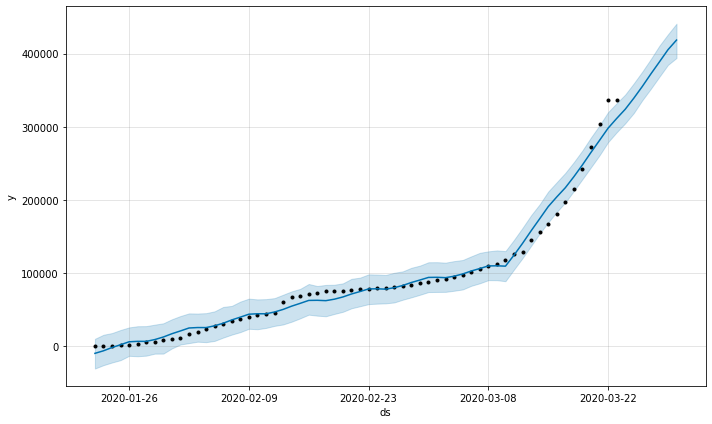

In [36]:
confirmed_forecast_plot = m.plot(forecast)

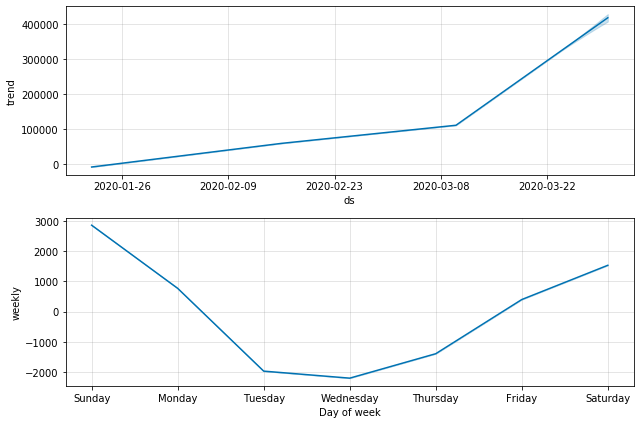

In [37]:
confirmed_forecast_plot =m.plot_components(forecast)

##4.2 Forecasting Worldwide Deaths using Prophet (Base model)

Generating a week ahead forecast of confirmed cases of NCOVID-19 using Prophet, with 95% prediction interval by creating a base model with no tweaking of seasonality-related parameters and additional regressors.

In [38]:
deaths.columns = ['ds','y']
deaths['ds'] = pd.to_datetime(deaths['ds'])

In [39]:
m = Prophet(interval_width=0.95)
m.fit(deaths)
future = m.make_future_dataframe(periods=7)
future.tail()

INFO:fbprophet:Disabling yearly seasonality. Run prophet with yearly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


,ds
64,2020-03-26
65,2020-03-27
66,2020-03-28
67,2020-03-29
68,2020-03-30


In [40]:
forecast = m.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
64,2020-03-26,15411.877522,14547.309588,16377.096356
65,2020-03-27,16199.617603,15178.485426,17132.736477
66,2020-03-28,17006.904589,15966.078117,17953.625145
67,2020-03-29,17831.505383,16791.834245,18767.828981
68,2020-03-30,18490.986176,17376.225378,19536.056776


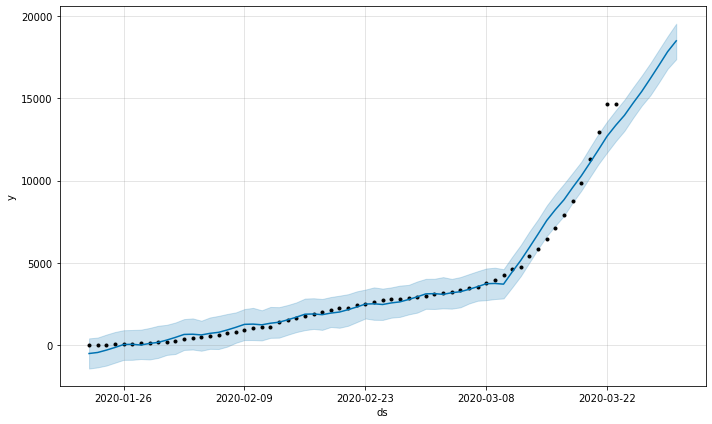

In [41]:
deaths_forecast_plot = m.plot(forecast)

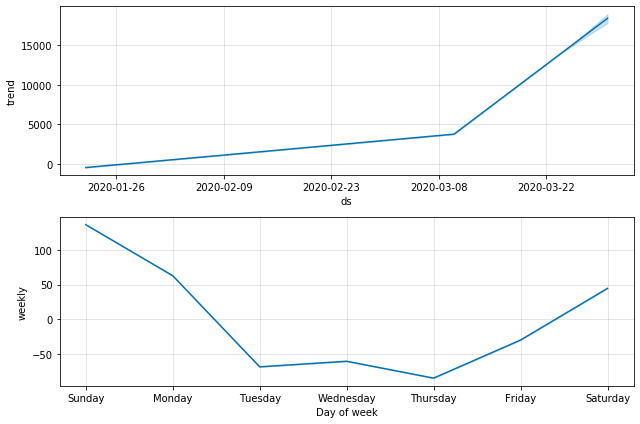

In [42]:
deaths_forecast_plot = m.plot_components(forecast)

##4.3 Forecasting Worldwide Recovered Cases with Prophet (Base model)

Generating a week ahead forecast of confirmed cases of NCOVID-19 using Prophet, with 95% prediction interval by creating a base model with no tweaking of seasonality-related parameters and additional regressors.

In [43]:
recovered.columns = ['ds','y']
recovered['ds'] = pd.to_datetime(recovered['ds'])

In [44]:
m = Prophet(interval_width=0.95,yearly_seasonality=True,daily_seasonality=True)
m.fit(recovered)
future = m.make_future_dataframe(periods=7)
future.tail()

,ds
64,2020-03-26
65,2020-03-27
66,2020-03-28
67,2020-03-29
68,2020-03-30


In [45]:
forecast = m.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
64,2020-03-26,106835.927475,105797.324328,107795.261201
65,2020-03-27,107819.724210,106793.731500,108929.810575
66,2020-03-28,107971.074730,106989.159715,109015.404217
67,2020-03-29,106253.818952,105247.729708,107277.052513
68,2020-03-30,101633.075842,100648.732016,102640.001586


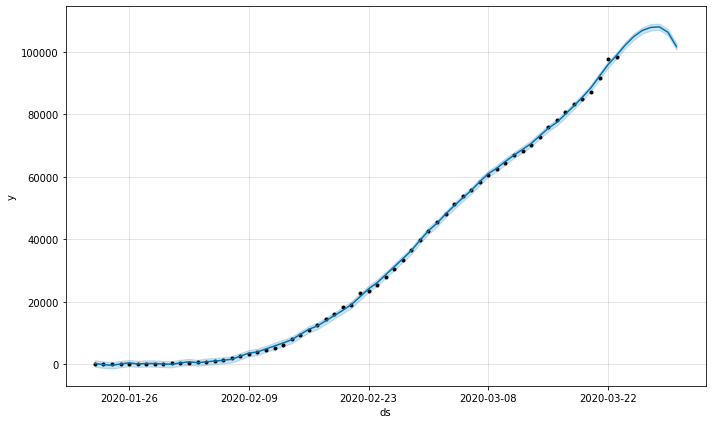

In [46]:
recovered_forecast_plot = m.plot(forecast)

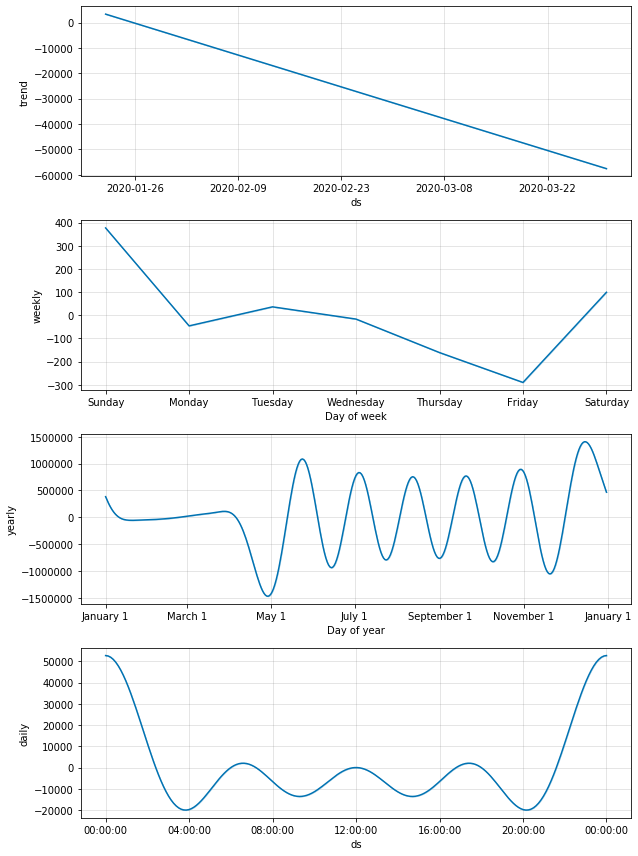

In [47]:
recovered_forecast_plot = m.plot_components(forecast)
